In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../')

In [2]:
from models.cmf_vincent.cmf import read_triple_data

class Args():
    def __init__(self, k, iter, user=0, item=0):
        self.train = "../models/cmf_vincent/data/ml-1m/train.txt"
        self.test = "../models/cmf_vincent/data/ml-1m/test.txt"
        self.item = "../models/cmf_vincent/data/ml-1m/item.txt" if item > 0 else ""
        self.user = "../models/cmf_vincent/data/ml-1m/user.txt" if user > 0 else ""
        self.out = "../output/out-cmf.txt"
        self.link = 'log_dense'
        self.alphas = '0.4'
        if user > 0:
            self.alphas += '-' + str(user)
        if item > 0:
            self.alphas += '-' + str(item)
        self.k = k
        self.reg = 0.1
        self.lr = 0.1
        self.iter = iter
        self.tol = 0.0
        self.verbose = True
        self.boolean = True
        
args = Args(k=40, iter=200, user=0.5, item=0.5)

[Xs_trn, Xs_tst, rc_schema, modes] = read_triple_data(args.train, args.test, args.user, args.item, args.link, args.boolean)

In [4]:
Xs_trn

In [3]:
Xs_tst

[<6040x3883 sparse matrix of type '<class 'numpy.int32'>'
 	with 100021 stored elements in Compressed Sparse Column format>,
 None,
 None]

[I] cross-validation, sampling positives
[I]   Data seed    : 1997
[I]   partition    : [0, 160034, 320068, 480101, 640134, 800167]
[I]   test_size    : 0.2
[I]   seed         : 1997
[I] getting cross-validation indices
[I]   current fold         : 1
[I]   current train size   : 640133
[I]   current val size     : 160034
[I] cross-validation, sampling negatives
[I]   Data seed    : 6666
[I]   n_negatives  : 100020
[I]   test_size    : 20004
[I]   seed         : 6666
[I] getting cross-validation indices
[I]   current fold         : 1
[I]   current train size   : 64012
[I]   current val size     : 16004
[I] Summary of X(6040, 3883):
[I]   row/col mean (162.0, 104.1), row/col median (70.0, 61.0)
[I] Summary of Y(6040, 29):
[I]   row/col mean (475.5, 2.3), row/col median (281.0, 2.0)
[I] Summary of Z(99, 3883):
[I]   row/col mean (2.7, 103.9), row/col median (2.0, 22.0)


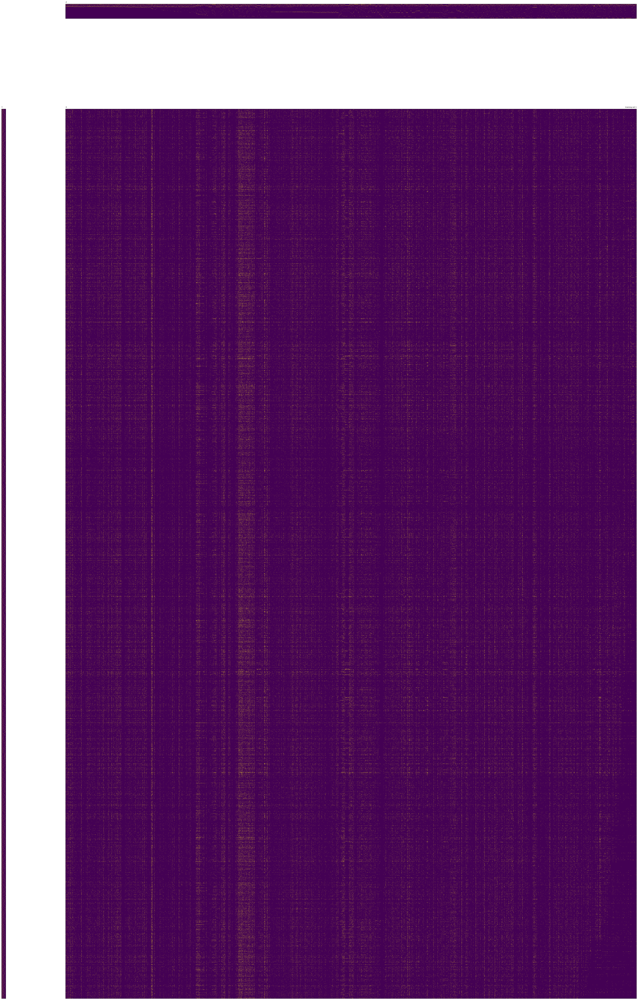

[I] Summary of X(6040, 3883):
[I]   row/col mean (41.0, 26.4), row/col median (17.0, 15.0)


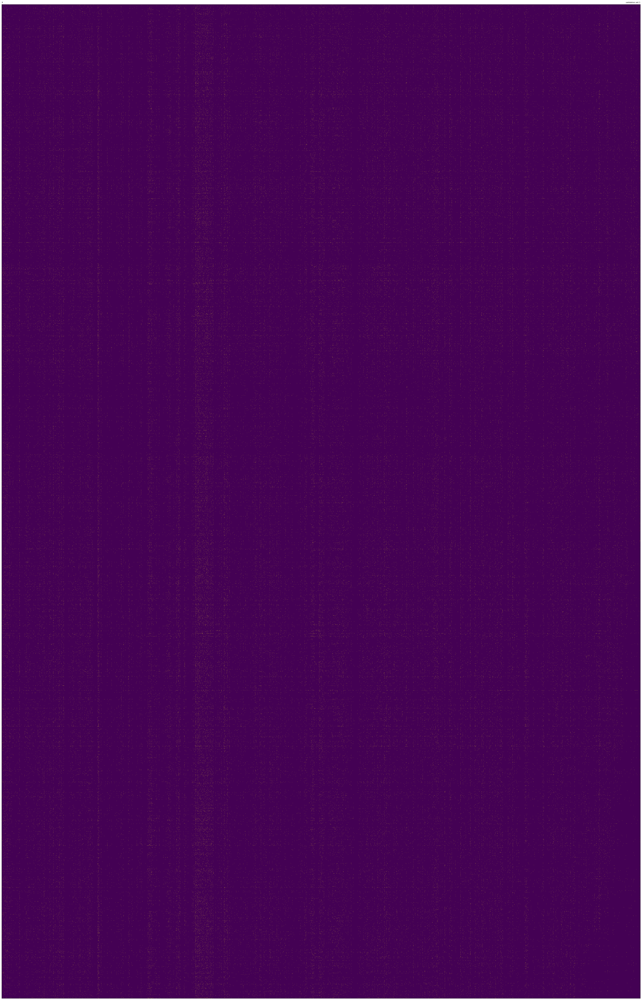

[I] Summary of X(6040, 3883):
[I]   row/col mean (51.2, 32.9), row/col median (22.0, 19.0)


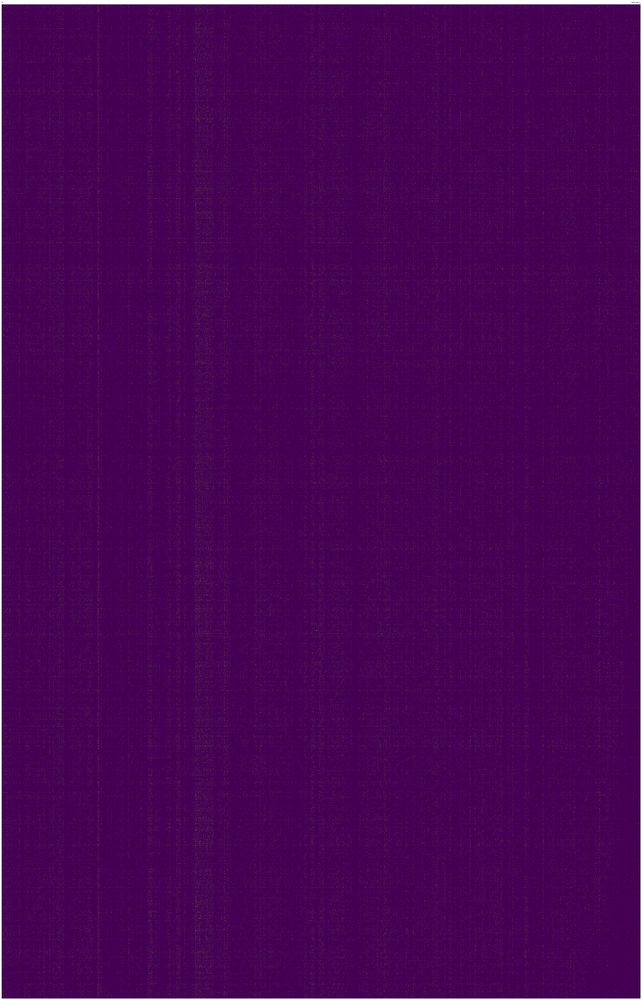

[I] cross-validation, sampling positives
[I]   Re-using original config, seed will be ignored.
[I] getting cross-validation indices
[I]   current fold         : 2
[I]   current train size   : 640133
[I]   current val size     : 160034
[I] cross-validation, sampling negatives
[I]   Re-using original config, seed will be ignored.
[I] getting cross-validation indices
[I]   current fold         : 2
[I]   current train size   : 64013
[I]   current val size     : 16003
[I] Summary of X(6040, 3883):
[I]   row/col mean (162.0, 104.2), row/col median (70.0, 61.0)
[I] Summary of Y(6040, 29):
[I]   row/col mean (475.5, 2.3), row/col median (281.0, 2.0)
[I] Summary of Z(99, 3883):
[I]   row/col mean (2.7, 103.9), row/col median (2.0, 22.0)


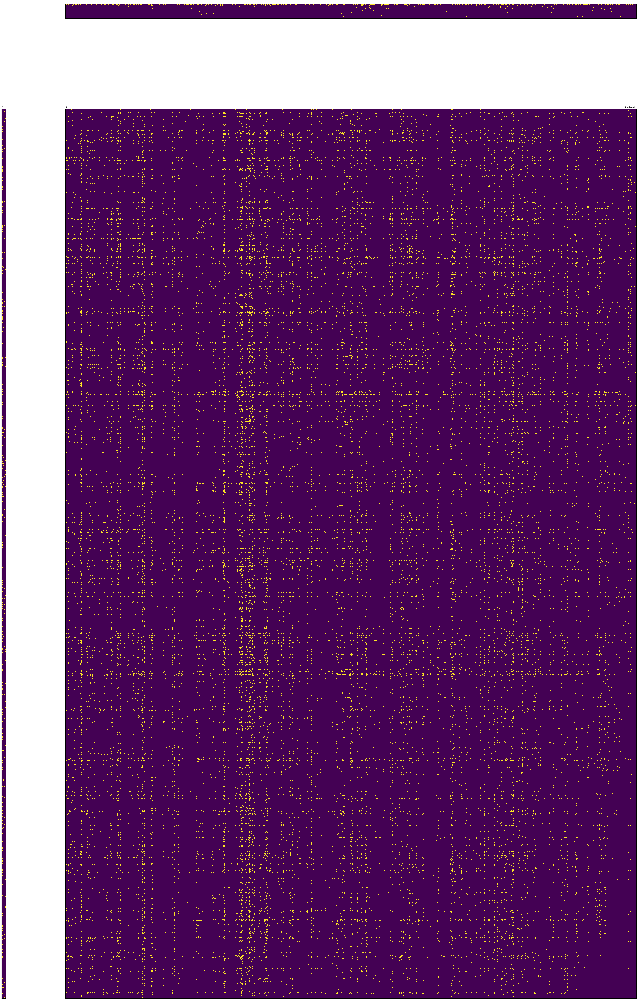

[I] Summary of X(6040, 3883):
[I]   row/col mean (41.0, 26.4), row/col median (18.0, 15.0)


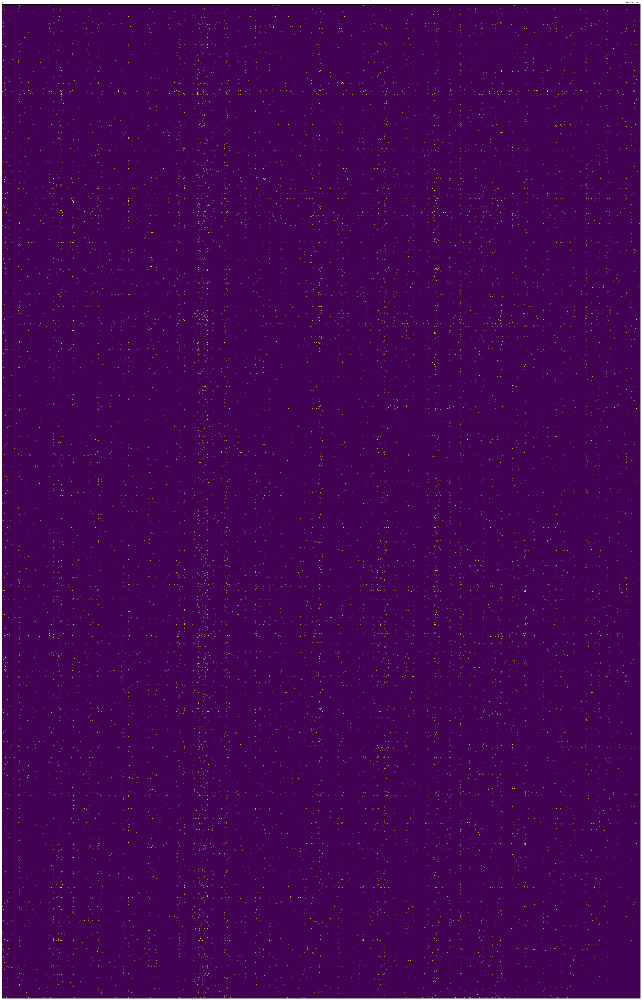

[I] Summary of X(6040, 3883):
[I]   row/col mean (51.2, 32.9), row/col median (22.0, 19.0)


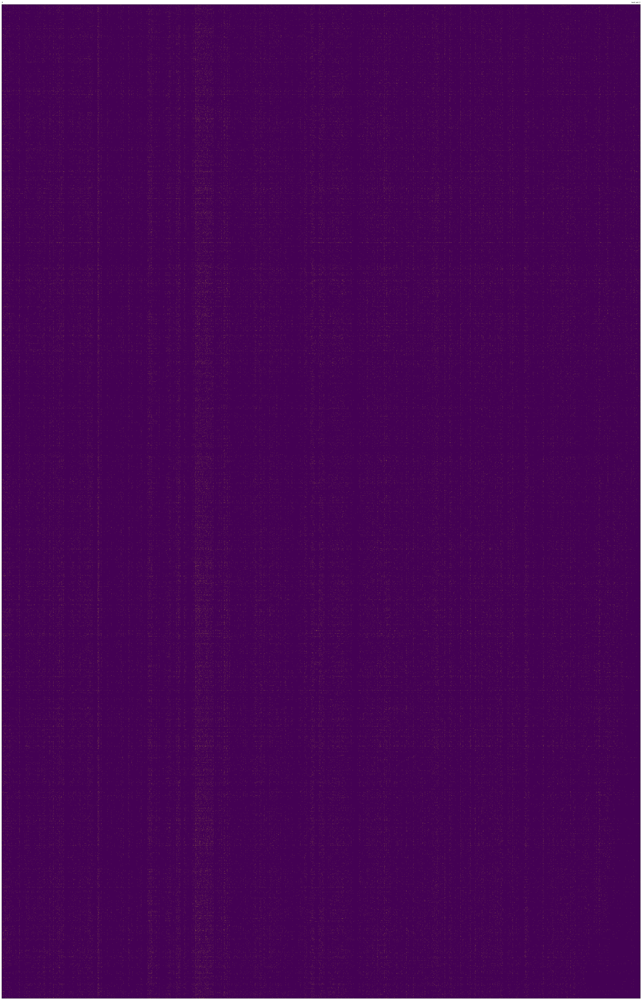

[I] cross-validation, sampling positives
[I]   Re-using original config, seed will be ignored.
[I] getting cross-validation indices
[I]   current fold         : 3
[I]   current train size   : 640134
[I]   current val size     : 160033
[I] cross-validation, sampling negatives
[I]   Re-using original config, seed will be ignored.
[I] getting cross-validation indices
[I]   current fold         : 3
[I]   current train size   : 64013
[I]   current val size     : 16003
[I] Summary of X(6040, 3883):
[I]   row/col mean (162.0, 104.1), row/col median (70.0, 60.5)
[I] Summary of Y(6040, 29):
[I]   row/col mean (475.5, 2.3), row/col median (281.0, 2.0)
[I] Summary of Z(99, 3883):
[I]   row/col mean (2.7, 103.9), row/col median (2.0, 22.0)


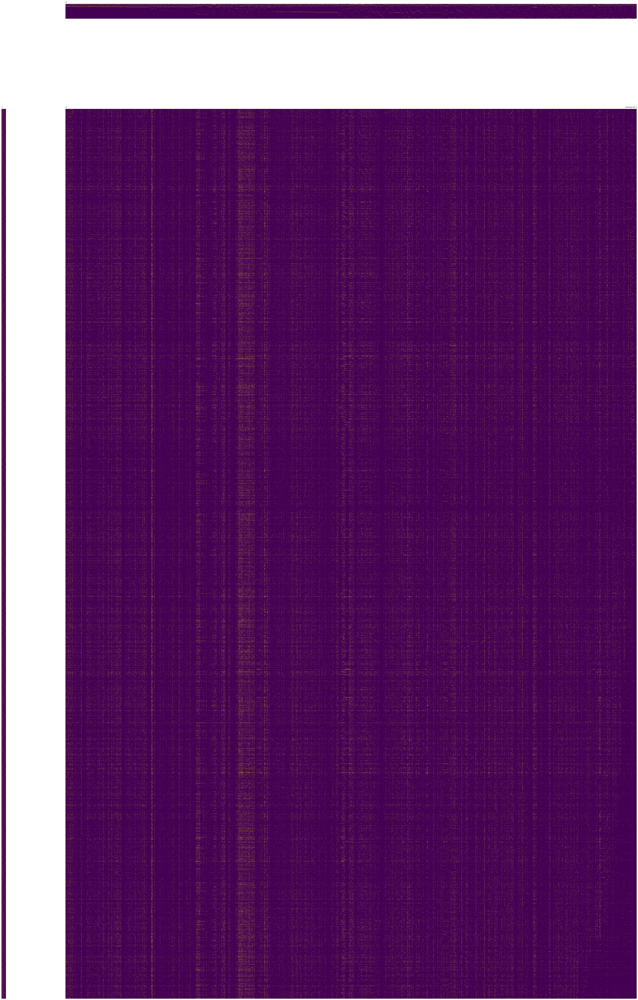

[I] Summary of X(6040, 3883):
[I]   row/col mean (41.0, 26.4), row/col median (18.0, 15.0)


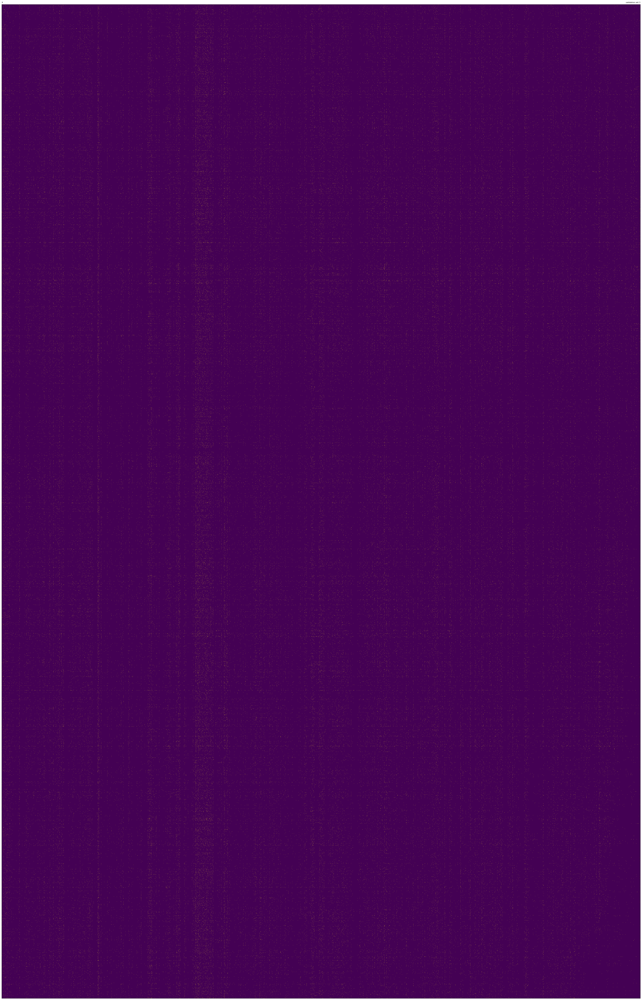

[I] Summary of X(6040, 3883):
[I]   row/col mean (51.2, 32.9), row/col median (22.0, 19.0)


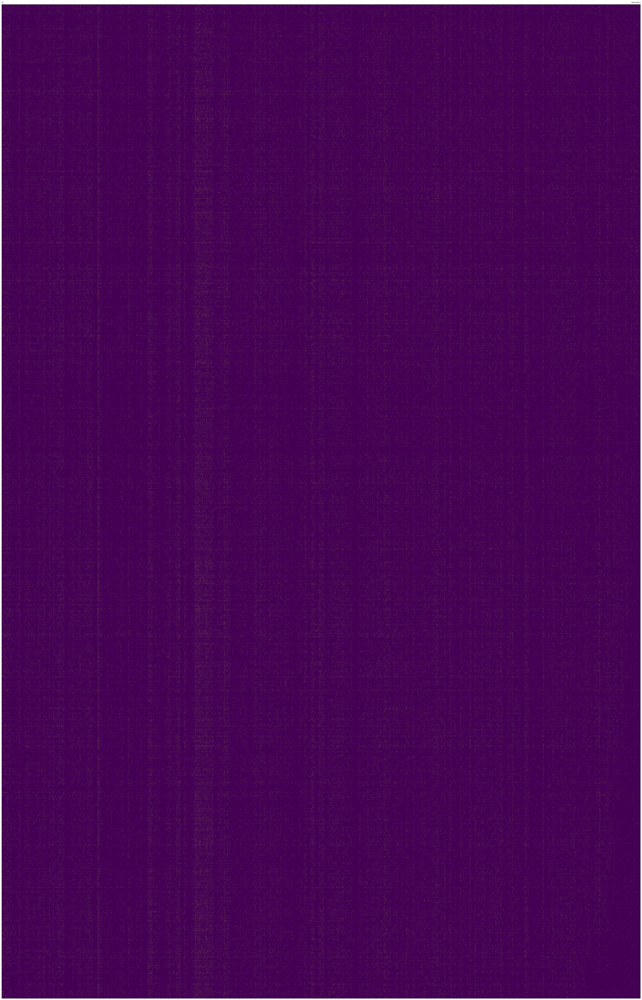

[I] cross-validation, sampling positives
[I]   Re-using original config, seed will be ignored.
[I] getting cross-validation indices
[I]   current fold         : 4
[I]   current train size   : 640134
[I]   current val size     : 160033
[I] cross-validation, sampling negatives
[I]   Re-using original config, seed will be ignored.
[I] getting cross-validation indices
[I]   current fold         : 4
[I]   current train size   : 64013
[I]   current val size     : 16003
[I] Summary of X(6040, 3883):
[I]   row/col mean (162.0, 104.1), row/col median (69.0, 60.5)
[I] Summary of Y(6040, 29):
[I]   row/col mean (475.5, 2.3), row/col median (281.0, 2.0)
[I] Summary of Z(99, 3883):
[I]   row/col mean (2.7, 103.9), row/col median (2.0, 22.0)


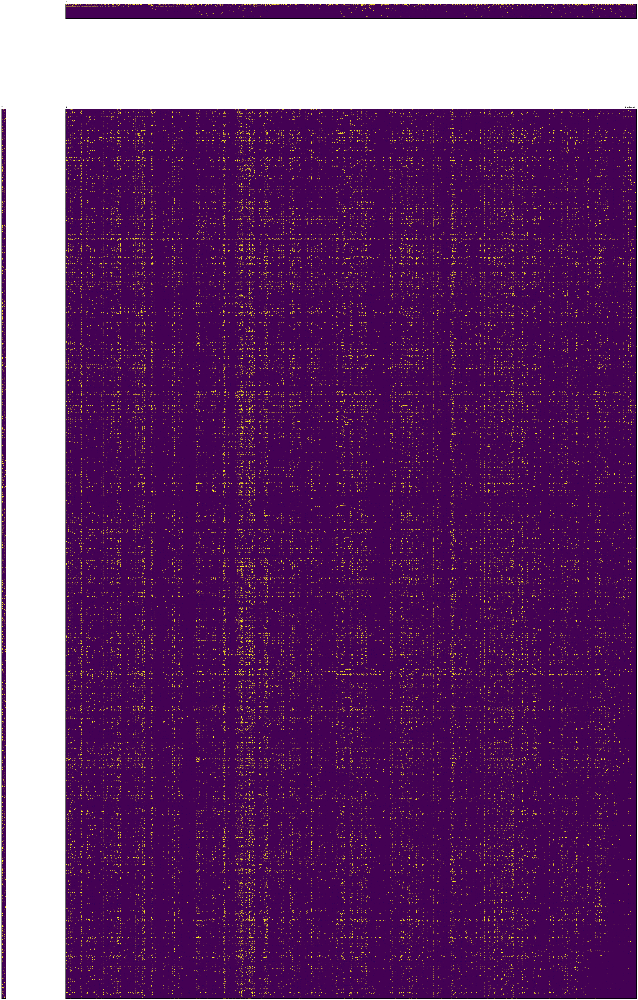

[I] Summary of X(6040, 3883):
[I]   row/col mean (41.0, 26.4), row/col median (18.0, 15.0)


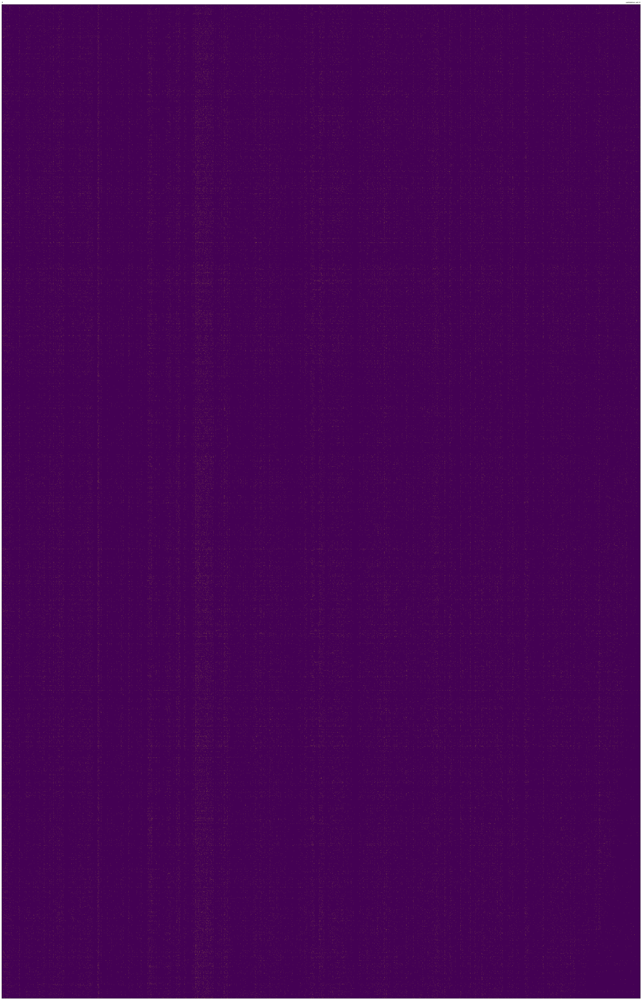

[I] Summary of X(6040, 3883):
[I]   row/col mean (51.2, 32.9), row/col median (22.0, 19.0)


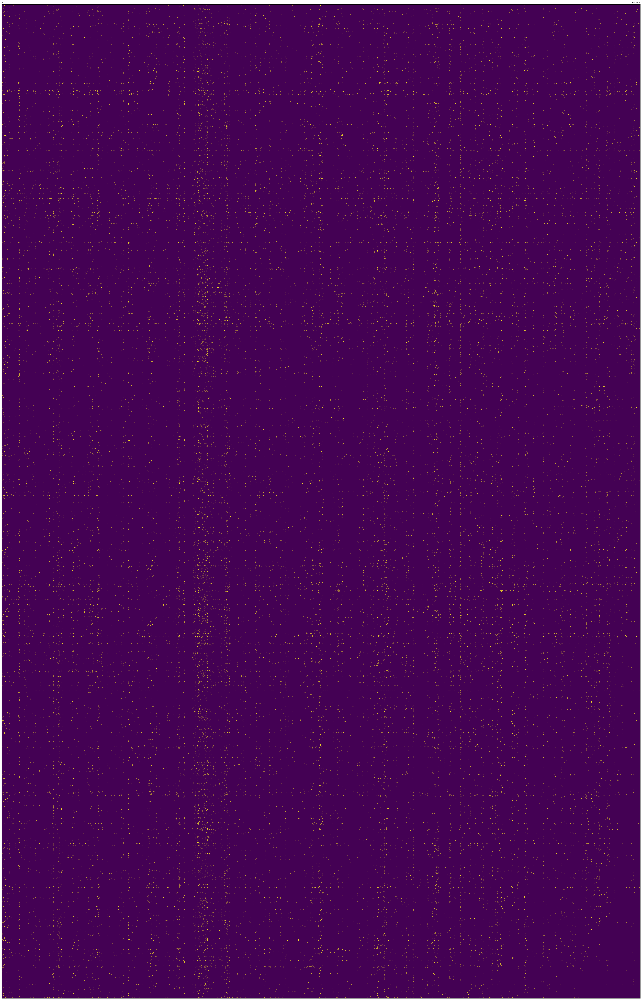

[I] cross-validation, sampling positives
[I]   Re-using original config, seed will be ignored.
[I] getting cross-validation indices
[I]   current fold         : 5
[I]   current train size   : 640134
[I]   current val size     : 160033
[I] cross-validation, sampling negatives
[I]   Re-using original config, seed will be ignored.
[I] getting cross-validation indices
[I]   current fold         : 5
[I]   current train size   : 64013
[I]   current val size     : 16003
[I] Summary of X(6040, 3883):
[I]   row/col mean (162.0, 104.1), row/col median (70.0, 60.0)
[I] Summary of Y(6040, 29):
[I]   row/col mean (475.5, 2.3), row/col median (281.0, 2.0)
[I] Summary of Z(99, 3883):
[I]   row/col mean (2.7, 103.9), row/col median (2.0, 22.0)


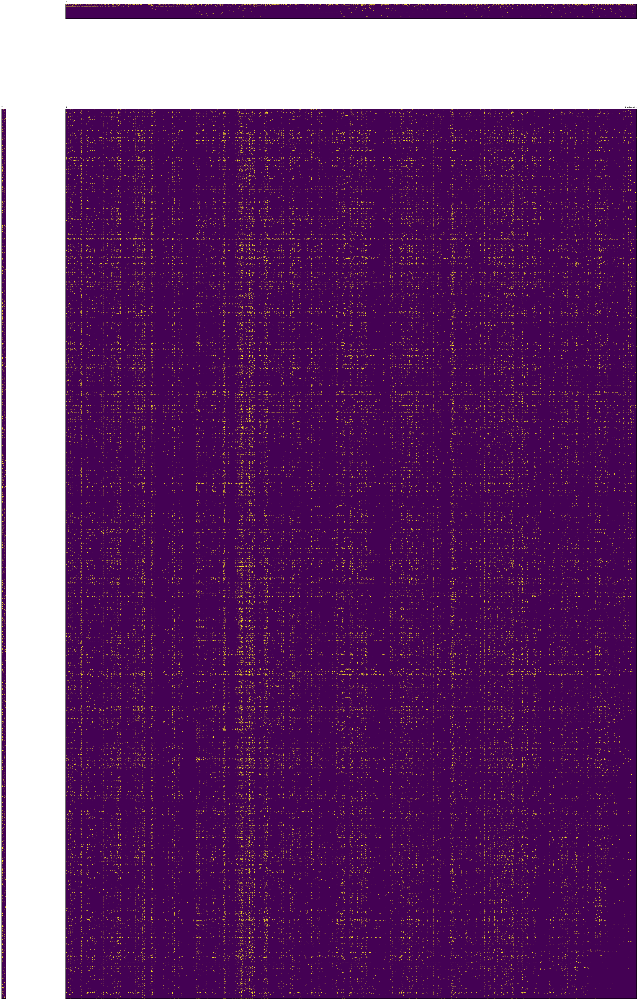

[I] Summary of X(6040, 3883):
[I]   row/col mean (41.0, 26.4), row/col median (17.0, 15.0)


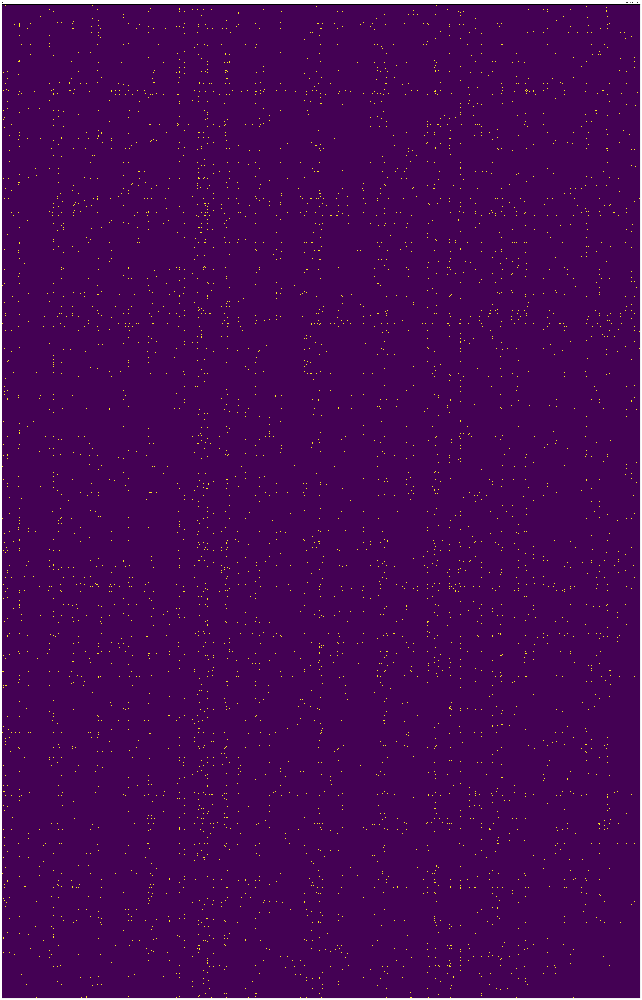

[I] Summary of X(6040, 3883):
[I]   row/col mean (51.2, 32.9), row/col median (22.0, 19.0)


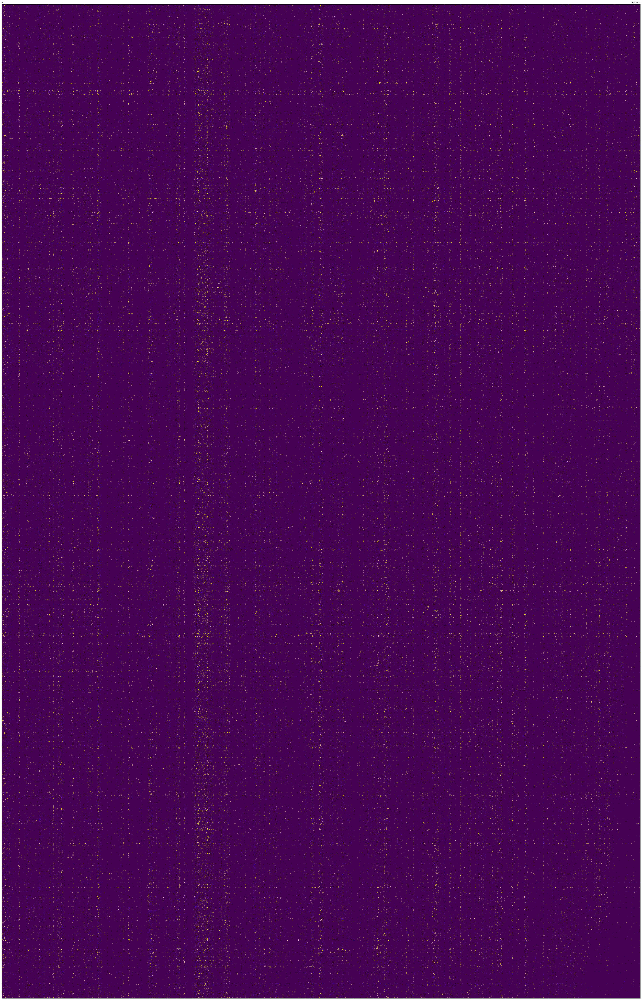

In [6]:
n_fold = 5

for i in range(n_fold):
    fold = i + 1

    X_data.cross_validation(test_size=0.2, n_folds=5, current_fold=fold, seed=1997)
    pos_train_val_size = X_data.pos_train_size + X_data.pos_val_size
    X_data.cv_negative_sample(n_folds=n_fold,
                              current_fold=fold,
                              train_val_size=int(0.1 * pos_train_val_size),
                              test_size=int(0.1 * X_data.pos_test_size), 
                              seed=6666, type='popularity')

    ds_train = Dataset()
    ds_train.load_data(X=X_data.train_data, U=X_data.U, V=X_data.V)
    ds_train.load_data(X=Y_data)
    ds_train.load_data(X=Z_data)

    ds_val = Dataset()
    ds_val.load_data(X=X_data.val_data, U=X_data.U, V=X_data.V)

    ds_test = Dataset()
    ds_test.load_data(X=X_data.test_data, U=X_data.U, V=X_data.V)

    ds_train.summarize(title='training set {}'.format(fold), display=True, pixels=2, ordered=True)
    ds_val.summarize(title='validation set {}'.format(fold), display=True, pixels=2, ordered=True)
    ds_test.summarize(title='test set {}'.format(fold), display=True, pixels=2, ordered=True)